# Search for Similar Images

Ari Vesalainen<br>
<p>
This is part of the DHH23 Early_modern -project under the theme "Enlightening Illustrations: Analyzing the Role of Images in Early Modern Scientific Publications". The main objective of this task is to analyze the subset of illustrations to detect how computer vision and deep learning methods can be used for detecting the re-use of the images.
<p>
This work is inspired blog post of Maciej D. Korzec https://towardsdatascience.com/recommending-similar-images-using-pytorch-da019282770c 

In [1]:
import os
from PIL import Image
import torch
from torchvision import models, datasets, transforms
import numpy as np
from numpy.testing import assert_almost_equal
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.offsetbox import (TextArea, OffsetImage, AnnotationBbox)
from sklearn.decomposition import PCA
from numpy.linalg import norm
from tqdm import tqdm
import pandas as pd
import seaborn as sns
import pickle
import random

In [2]:
# set some definitions

DATA_DIR = "<folder for all images you want to analyze> "
SEARCH_DIR = "<folder for images to be checked>"
DB_DIR = "folder where all data structures are stored to avoid re-calculation"
MODEL_TYPE = ["resnet18", "resnet50"] # Supported pre-trained models
THRESHOLD = 0.95
NUMBER_OF_FILES = 20

In [3]:
DATA_DIR = "C:/Users/arive/Datasets/DHH23/botanical"
SEARCH_DIR = "C:/Users/arive/Datasets/DHH23/search2"
DB_DIR = "C:/Users/arive/Datasets/DHH23"
MODEL_TYPE = "resnet18" # resnet18 or resnet50
THRESHOLD = 0.95

# Some function definitions

In [4]:
# create transforms, Resnet expects the images are in format 256x256 pixels

tc = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor()              
    ])

In [5]:
"""
Class for converting images to vectors, supports two Resnet-variants, i.e., Resnet-18 and Resnet-50
Resnet is excellent deep learning model for image classification, however, here only the feature extraction is used 
and fully connected layers are ignored.  
Output for Resnet-18 is a vector of 512 features and output for Resnet-50 is a vector of 2048 features. The feature
vectors are used to calculate the cosine similarity between two vectors, i.e., images, based on cosine similarity.  
"""

class Image2Vector():
    def __init__(self, modelType, transforms):
        
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.modelType = modelType
        self.model, self.featureLayer = self.getFeatureLayer()
        self.model = self.model.to(self.device)
        self.transforms = transforms
        self.model.eval()
        
    def getVector(self, img):
        image = self.transforms(img).unsqueeze(0).to(self.device)
        embedding = torch.zeros(1, self.layer_output_size, 1, 1)

        def copyData(m, i, o): embedding.copy_(o.data)
       
        h = self.featureLayer.register_forward_hook(copyData)
        self.model(image)
        h.remove()

        return embedding.numpy()[0, :, 0, 0]
    
    def getFeatureLayer(self):
        if self.modelType == "resnet18":
            model = models.resnet18(weights=True)
            self.layer_output_size = 512
        elif self.modelType == "resnet50":
            self.layer_output_size = 2048
            model = models.resnet50(weights=True)

        layer = model._modules.get('avgpool')
        
        return model, layer
        

In [33]:
"""
Load image feature vectors into dictionary where key is the file name of the image. Image vectors are stored on disk to
avoid unnecessary calulations
Input:
    modelType: type of deep learning model (Resnet-18 or Resnet-50) 
    db_dir: folder where feature vectors database is stored
    data_dir: folder for analyzed images
    transform: As model is based on Resnet, all input needs to be in 256x256 format 
Output:
    feature_vectors: dictionary of feature vectors, key is the file name of the image
    
"""

def loadVectors(modelType, db_dir, data_dir, transform=None):
    feature_vectors_path = os.path.join(db_dir,"feature_vectors_{}.pkl".format(modelType))
    
    # if feature vector database is already created, use it
    if os.path.exists(feature_vectors_path):
        print("Loading feature vectors from {}".format(feature_vectors_path))
        file = open(feature_vectors_path, 'rb')
        feature_vectors = pickle.load(file)  
        file.close()
    else: # otherwise create it using Image2Vector model and save it for further use
        img2vec = Image2Vector(modelType, transform)
        feature_vectors = {}
        print("File for feature vectors doesn't exist, converting images to feature vectors and saving those")
        for image in tqdm(os.listdir(data_dir)):
            I = Image.open(os.path.join(data_dir, image)).convert("RGB")
            vec = img2vec.getVector(I)
            feature_vectors[image] = vec
            I.close()
        with open(feature_vectors_path, 'wb') as handle:
            pickle.dump(feature_vectors, handle, protocol=pickle.HIGHEST_PROTOCOL)
    return feature_vectors


In [34]:
"""
Calculate similarity between all images and store it in Dataframe

Input:
    vectors: dictionary of feature vectors, key is the file name of the image
Output:
    matrix: Pandas Dataframe, size #files x #files, cell items are cosine similarity between corresponding images 
"""

def getSimilarityMatrix(vectors):
    v = np.array(list(vectors.values())).T
    sim = np.inner(v.T, v.T) / ((np.linalg.norm(v, axis=0).reshape(-1,1)) * ((np.linalg.norm(v, axis=0).reshape(-1,1)).T))
    keys = list(vectors.keys())
    matrix = pd.DataFrame(sim, columns = keys, index = keys)
    
    return matrix

"""
Create data structures to identify the k-most similar images (names and values)
Input:
    matrix:  Pandas Dataframe, size #files x #files, cell items are cosine similarity between corresponding images 
    modelType: type of deep learning model (Resnet-18 or Resnet-50)
    db_dir: folder where feature vectors database is stored
    k: number of most similar images to be stored for each image
Output
    similarNames: Dataframe, size #files x k to store k-most similar image names
    SimilarValues: Dataframe, size #files x k to store k-most similarity scores
"""

def createSimilarityDB(matrix, modelType, db_dir, k=5):

    similarNames = pd.DataFrame(index = matrix.index, columns = range(k))
    similarValues = pd.DataFrame(index = matrix.index, columns = range(k))

    for j in tqdm(range(matrix.shape[0])):
        kSimilar = matrix.iloc[j, :].sort_values(ascending = False).head(k)
        similarNames.iloc[j, :] = list(kSimilar.index)
        similarValues.iloc[j, :] = kSimilar.values
    similarNames_path = os.path.join(db_dir, "similarNames_{}.pkl".format(modelType))
    similarValues_path = os.path.join(db_dir, "similarValues_{}.pkl".format(modelType))
    similarNames.to_pickle(similarNames_path)
    similarValues.to_pickle(similarValues_path)
    return similarNames, similarValues

In [35]:
"""
Compute cosine similarity between two vectors
Input
    A: 1st vector
    B: 2nd vector
Output
    cosine: cosine similarity of vectors A and B
"""

def computeSimilarity(A,B):
# compute cosine similarity
    cosine = np.dot(A,B)/(norm(A)*norm(B))
    return cosine
"""
Get the sort key for sorting lists of lists
Input:
    elem
Output:
    key for the sorting
"""
# take third element for sort
def sortKey(elem):
    return elem[2]

def Union(lst1, lst2):
    final_list = list(set(lst1) | set(lst2))
    return final_list
def Intersection(lst1, lst2):
    lst3 = [value for value in lst1 if value in lst2]
    return lst3

In [36]:
"""
Plot two images, side by side
Input:
    dir1: directory path for 1st image
    im1: file name for the 1st image
    dir2: directory path for 2nd image
    im2: file name for the 2nd image
    title: title of the plotted graph
"""

def plot_images(dir1, im1, dir2, im2, title):
# Load the images
    image1 = mpimg.imread(os.path.join(dir1, im1 ))
    image2 = mpimg.imread(os.path.join(dir2, im2 ))
    
# Create a figure and axes
    fig, axes = plt.subplots(1, 2)
    fig.suptitle(title)
# Plot the first image
    axes[0].imshow(image1,cmap="gray")
    axes[0].set_title(im1)

# Plot the second image
    axes[1].imshow(image2,cmap="gray")
    axes[1].set_title(im2)

# Remove the axis labels
    for ax in axes:
        ax.axis('off')

# Adjust the spacing between subplots
    plt.subplots_adjust(wspace=0.2)

# Display the plot
    plt.show()


In [37]:
"""
Helper function to set labels when plotting
"""

def setAxes(ax, image, query = False, **kwargs):
    value = kwargs.get("value", None)
    if query:
        ax.set_xlabel("Query Image\n{0}".format(image), fontsize = 8)
    else:
        ax.set_xlabel("Similarity value {1:1.3f}\n{0}".format( image,  value), fontsize = 8)
    ax.set_xticks([])
    ax.set_yticks([])

"""
Get the k-most similar images 
Input:
    image
    simNames
    SimValues
Output:
    imgs
    vals
"""

def getSimilarImages(image, simNames, simVals):
    if image in set(simNames.index):
        imgs = list(simNames.loc[image, :])
        vals = list(simVals.loc[image, :])
        return imgs[1:], vals[1:] # first item is image itself, so ignore it
    else:
        print("'{}' Unknown image".format(image))

        

In [38]:
"""
Given image is searched from the similarity database and if similarity between images reaches the threshold value 
it is included in the search results. For visualization purposes the results are presented in 2-dimensional graphs as it is
not possible to show these in 512-dimensional (Resnet-18) or 2048-dimensional (Resnet-50) space.
Input:
    data_dir: folder for analyzed images
    feature_vectors: dictionary of image feature vectors, key is image file name
    img2vec: model for tranforming images to feature vectors
    threshold: if the similarity between images reaches the threshold value it is included in the search results 
    image_path: file path for the searched image
    
"""

def searchImage(data_dir, feature_vectors, img2vec, threshold, image_path, suffix):

    embeddings = []
    search_vecs = []
    result_vecs = []
    result_names = []

    # extract feature vector for searched image
    I = Image.open(image_path).convert("RGB")
    search_vec = img2vec.getVector(I)
    search_vecs.append(search_vec)
    
    # search the feature vector to check if similar images exixts
    for vec in feature_vectors.keys():
        embeddings.append(feature_vectors[vec])
        sim = computeSimilarity(search_vec, feature_vectors[vec])
        if sim > threshold:
            result_vecs.append(feature_vectors[vec])
            result_names.append([os.path.join(data_dir,vec),sim])
    
    # dimension of vectors is 512 (Resnet-18) or 2048 (Resnet-50), use dimension reduction method (2-dim) to visualize it
    vectors, search_vectors, results_vectors = reduce_dimensions(embeddings, search_vecs, result_vecs, suffix)

    # calculate boundaries for the found images
    min_x = np.min(results_vectors[:,0])
    max_x = np.max(results_vectors[:,0])
    min_y = np.min(results_vectors[:,1])
    max_y = np.max(results_vectors[:,1])

    # Visualize results by plottint a graph where results are shown in 2-dimensional space
    
    plt.figure(figsize=(16,16))
    plt.title("Search results: {} images found".format(len(results_vectors)))
    plt.scatter(results_vectors[:,0],results_vectors[:,1])
    plt.show()
    plt.savefig("scatter_plot_{}.png".format(suffix))
    # Visualize results and their distance to searched image using image thumbnails in 2-dimensional space
    
    plotSimilarity(image_path, search_vectors, result_names, results_vectors, suffix)

In [39]:
"""
Reduce dimensions of feature vector in order to show the results in 2-dimensional graph, used method is Principlal 
Component Analysis (PCA)

Input
    embeddings
    search_vecs
    result_vecs
Output
    reduced_vectors
    reduced_search_vectors
    reduced_results_vectors
"""
def reduce_dimensions(embeddings, search_vecs, result_vecs, suffix):
    # Apply PCA for dimensionality reduction from 512/2048 dimensional space to to 2 dimensional fot visualization purposes
    pca = PCA(n_components=2)
    reduced_vectors = pca.fit_transform(embeddings)
    reduced_search_vectors = pca.transform(search_vecs)
    reduced_results_vectors = pca.transform(result_vecs)
    plt.figure(figsize=(16,16))

# Visualize the similarity by plotting all image feature vectors, search results and searched image in same graph in 2-dim space

    plt.scatter(reduced_vectors[:, 0], reduced_vectors[:, 1], c="blue", label='Original Vectors')
    plt.scatter(reduced_results_vectors[:, 0], reduced_results_vectors[:, 1], c="red",s=50, label='Results Vectors')
    plt.scatter(reduced_search_vectors[:, 0], reduced_search_vectors[:, 1], c="black", s=50, label='Search Vectors')

# Set labels and title
    plt.xlabel('Dimension 1')
    plt.ylabel('Dimension 2')
    plt.title('Visualization of Vectors')

# Add legend
    plt.legend()

# Show the plot
    plt.show()
    plt.savefig("scatter_plot_{}.png".format(suffix))

    return reduced_vectors, reduced_search_vectors, reduced_results_vectors


In [40]:
"""
Plot images where the similarity has been detected, five images on one row

Input:
    image:  file name of the image
    input_dir: folder name for the image
    numCol: number of columns (=images) on one row
    numRow: number of rows in graph
    similarNames: Dataframe to included names of k-most similar images
    similarValues:  Dataframe to included similarity values of k-most similar images
"""                

def plotSimilarImages(image, input_dir, numCol, numRow, similarNames, similarValues, suffix):
    fig = plt.figure(figsize=(10, 20))
    
    simImages, simValues = getSimilarImages(image, similarNames, similarValues)

    # now plot the  most simliar images
    for j in range(0, numCol*numRow):
        ax = []
        if j == 0: # first plot the searhed image
            img = Image.open(os.path.join(input_dir, image))
            ax = fig.add_subplot(numRow, numCol, 1)
            setAxes(ax, image, query = True)
        else: # and then k-most similar images found
            img = Image.open(os.path.join(input_dir, simImages[j-1]))
            ax.append(fig.add_subplot(numRow, numCol, j+1))
            setAxes(ax[-1], simImages[j-1], value = simValues[j-1])
        img = img.convert('RGB')
        plt.imshow(img)
        img.close()
    
    plt.show()
    plt.savefig("similar_images_{}.png".format(suffix))

    
"""
Visualize the similarity, the closer the image is to the searched image more similar it is.

Input:
    search_image: image name used in the search
    reduced_search_vectors: coordinates for the searched image
    result_names: names of similar images
    reduced_results_vectors: coordinates of the similar images
"""

def plotSimilarity(search_image, reduced_search_vectors, result_names, reduced_results_vectors, suffix):
    
    fig, ax = plt.subplots(figsize=(16,16))
    min_x = np.min(reduced_results_vectors[:,0])
    max_x = np.max(reduced_results_vectors[:,0])
    min_y = np.min(reduced_results_vectors[:,1])
    max_y = np.max(reduced_results_vectors[:,1])
    
    multiplier_x = (max_x - min_x)
    multiplier_y = (max_y - min_y)
    idx = 1
    for image_path, coords in zip(result_names,reduced_results_vectors):
        if os.path.basename(image_path[0]) == os.path.basename(search_image): 
            continue
        xy = ((coords[0]-min_x)/(multiplier_x),(coords[1]-min_y)/(multiplier_y)) 
        name = os.path.basename(image_path[0])
        sim = image_path[1]
        offsetbox = TextArea("{}:{:.4f}".format(name,sim), minimumdescent=False)
 
        ab = AnnotationBbox(offsetbox, xy,
                        xybox=(1.02, xy[1]),
                        xycoords='data',
                        boxcoords=("axes fraction", "data"),
                        box_alignment=(0., 0.5),
                        arrowprops=dict(arrowstyle="->"))
        ax.add_artist(ab)    

        # Annotate the search image position with another image 
        arr_img = plt.imread(image_path[0])

        imagebox = OffsetImage(arr_img, zoom=0.03)
        imagebox.image.axes = ax
        ab = AnnotationBbox(imagebox, xy,
                            xybox=(-10,10),
                            xycoords='data',
                            boxcoords="offset points",
                            pad=0.5,
                            arrowprops=dict(
                                arrowstyle="->",
                                connectionstyle="angle,angleA=0,angleB=90,rad=3")
                            )

        ax.add_artist(ab)
        idx += 1
    # Annotate the 1st position with another text box ('Test')
    
    xy = ((reduced_search_vectors[0][0] - min_x)/(multiplier_x),(reduced_search_vectors[0][1]-min_y)/(multiplier_y))
    name = os.path.basename(search_image)
    offsetbox = TextArea("Searched image:{}".format(name), minimumdescent=False)

    ab = AnnotationBbox(offsetbox, xy,
                        xybox=(xy[0], 1.4),
                        xycoords='data',
                        boxcoords=("axes fraction", "data"),
                        box_alignment=(0., 0.5),
                        arrowprops=dict(arrowstyle="->"))
    ax.add_artist(ab)    
    # Annotate the search image position with another image 
    arr_img = plt.imread(search_image)
    imagebox = OffsetImage(arr_img, zoom=0.05)
    imagebox.image.axes = ax
    ab = AnnotationBbox(imagebox, xy,
                        xybox= (-10,10),
                        xycoords='data',
                        boxcoords="offset points",
                        pad=0.5,
                        arrowprops=dict(
                            arrowstyle="->",
                            connectionstyle="angle,angleA=0,angleB=90,rad=3")
                        )

    ax.add_artist(ab)

    # Fix the display limits to see everything
    ax.set_xlim(-0.2, 1.2)
    ax.set_ylim(-0.2, 1.4)
    plt.title("Searched image vs. search results")
    plt.xticks([])
    plt.yticks([])
    plt.savefig("search_image_{}.png".format(suffix))
    plt.show()
    

## Create basic similarity data structures for images and do some data exploration

### Resnet18

C:\Users\arive\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading feature vectors from C:/Users/arive/Datasets/DHH23\feature_vectors_resnet18.pkl


100%|███████████████████████████████████████████████████████████████████████████| 13151/13151 [00:21<00:00, 601.06it/s]


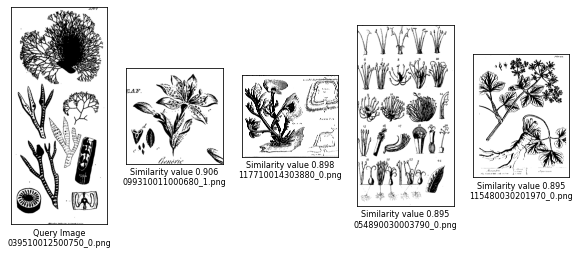

<Figure size 432x288 with 0 Axes>

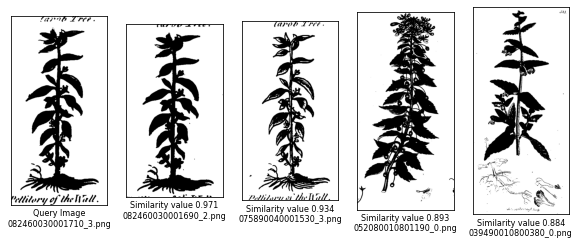

<Figure size 432x288 with 0 Axes>

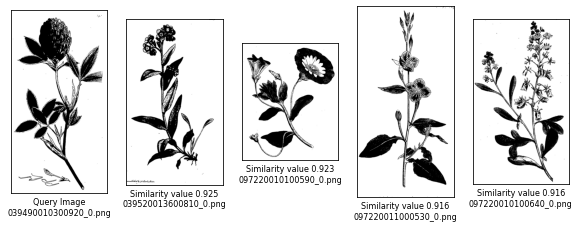

<Figure size 432x288 with 0 Axes>

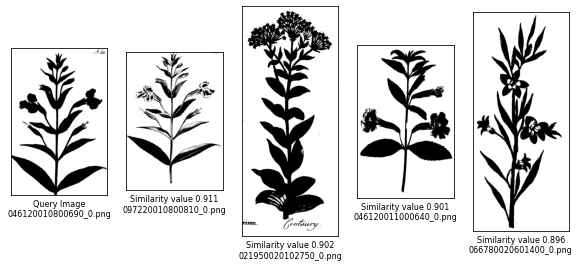

<Figure size 432x288 with 0 Axes>

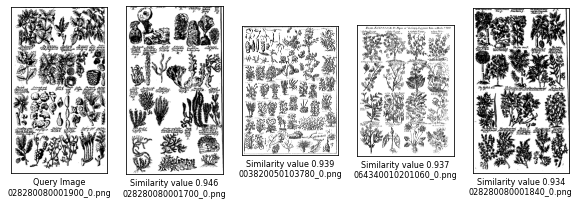

<Figure size 432x288 with 0 Axes>

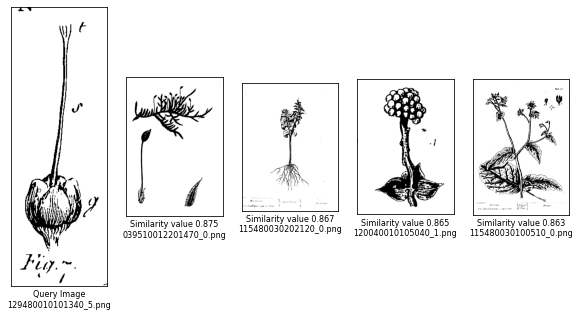

<Figure size 432x288 with 0 Axes>

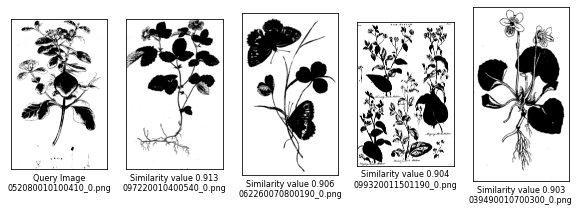

<Figure size 432x288 with 0 Axes>

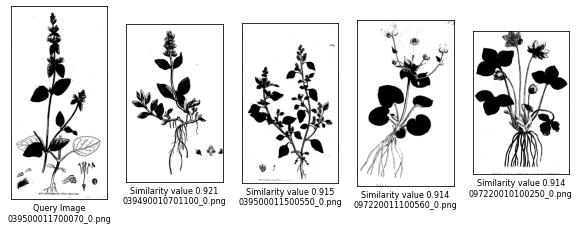

<Figure size 432x288 with 0 Axes>

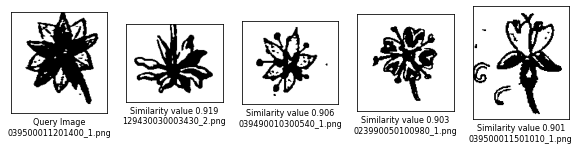

<Figure size 432x288 with 0 Axes>

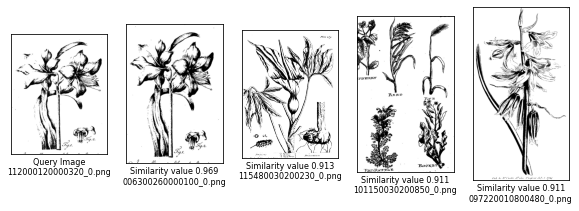

<Figure size 432x288 with 0 Axes>

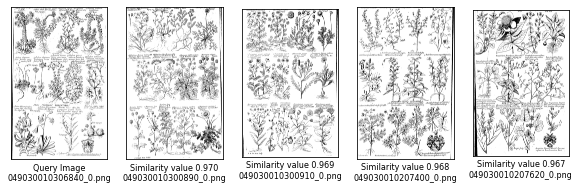

<Figure size 432x288 with 0 Axes>

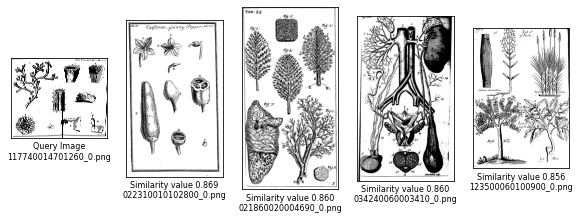

<Figure size 432x288 with 0 Axes>

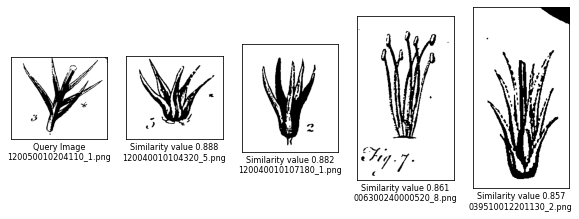

<Figure size 432x288 with 0 Axes>

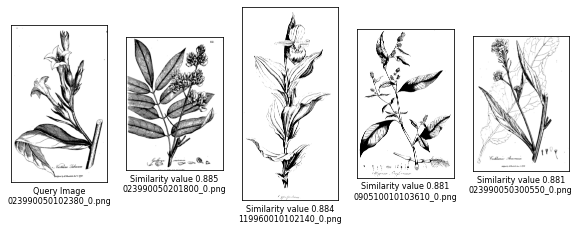

<Figure size 432x288 with 0 Axes>

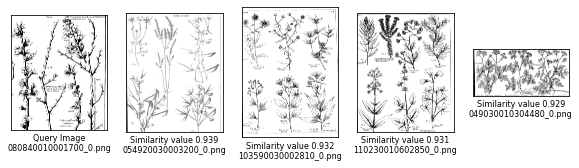

<Figure size 432x288 with 0 Axes>

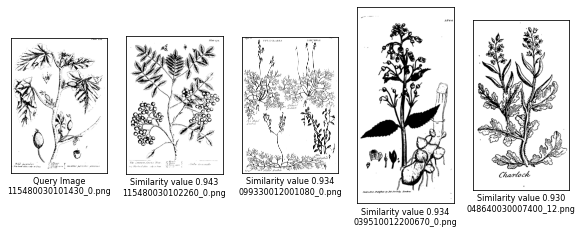

<Figure size 432x288 with 0 Axes>

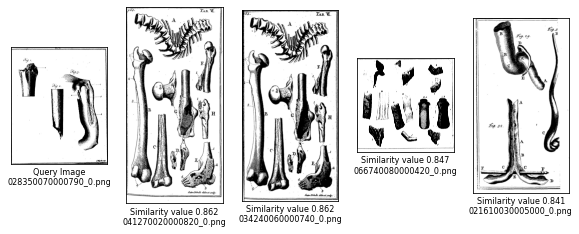

<Figure size 432x288 with 0 Axes>

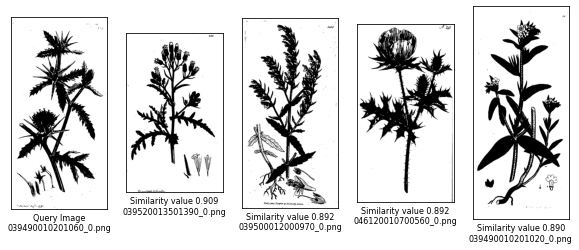

<Figure size 432x288 with 0 Axes>

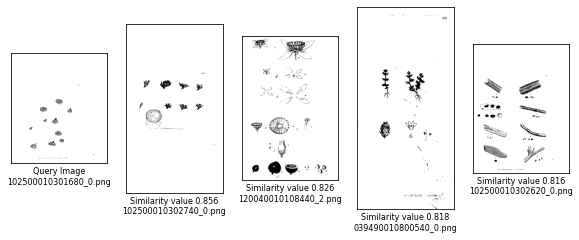

<Figure size 432x288 with 0 Axes>

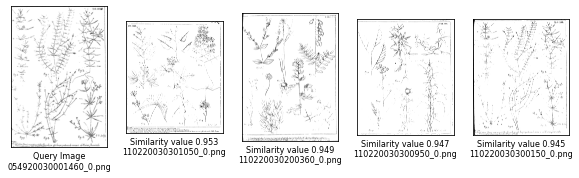

<Figure size 432x288 with 0 Axes>

In [41]:
# Load image feature vector from repository or create if necessary. Select some images to be plotted and k-most similar images
# in same graph

modelType = "resnet18"
img2vec = Image2Vector(modelType, tc)
feature_vectors_r18 = loadVectors(modelType, DB_DIR, DATA_DIR, tc)
similarityMatrix_r18 = getSimilarityMatrix(feature_vectors_r18)
simNames_r18, simValues_r18 = createSimilarityDB(similarityMatrix_r18, modelType, DB_DIR, 5)

numCol = 5
numRow = 1
num_files = NUMBER_OF_FILES
all_files = os.listdir(DATA_DIR)
# Shuffle the list of files randomly and pick some files to be plotted
random.shuffle(all_files)
selected_files = all_files[:num_files]

for image in selected_files:
    plotSimilarImages(image, DATA_DIR, numCol, numRow,simNames_r18, simValues_r18, modelType)

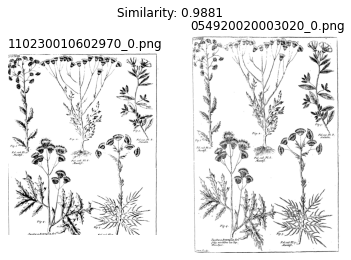

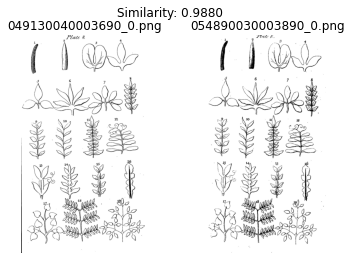

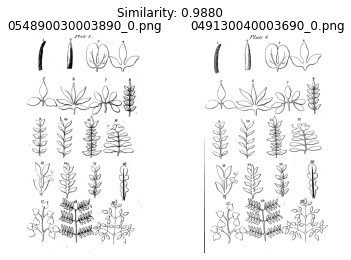

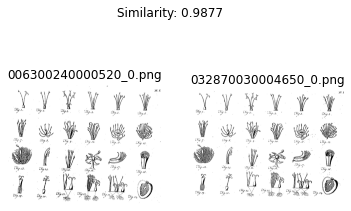

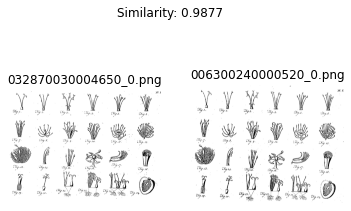

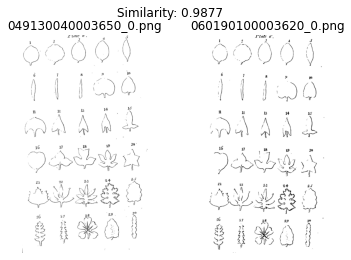

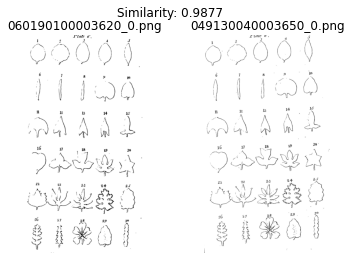

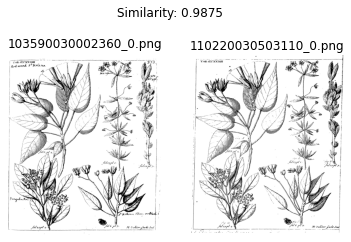

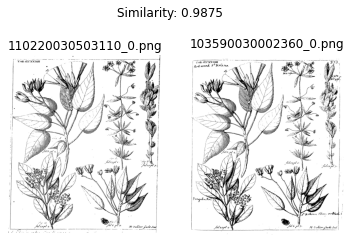

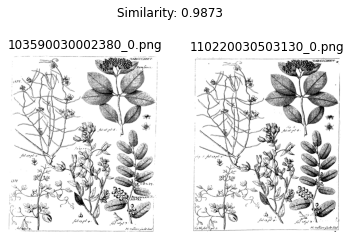

In [42]:
# For each image pick the most similar image and plot a selection of these in pairs. 
# This enables visual inspection of similarity 

r18_data = []
for x,y,z in zip(simNames_r18.index, list(simNames_r18[1]), list(simValues_r18[1])):
    r18_data.append([x,y,z])
r18_data.sort(key=sortKey,reverse=True)

for x in r18_data[100:110]:
    plot_images(DATA_DIR, x[0], DATA_DIR, x[1], "Similarity: {:.4f}".format(x[2]))

### Resnet50

C:\Users\arive\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading feature vectors from C:/Users/arive/Datasets/DHH23\feature_vectors_resnet50.pkl


100%|███████████████████████████████████████████████████████████████████████████| 13151/13151 [00:21<00:00, 620.24it/s]


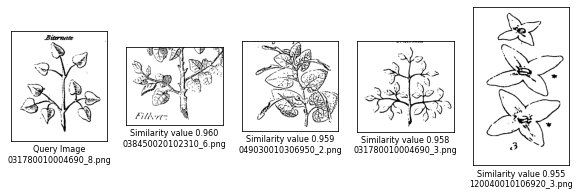

<Figure size 432x288 with 0 Axes>

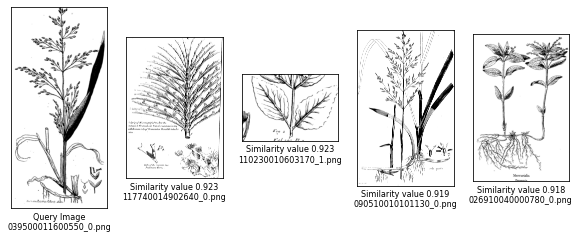

<Figure size 432x288 with 0 Axes>

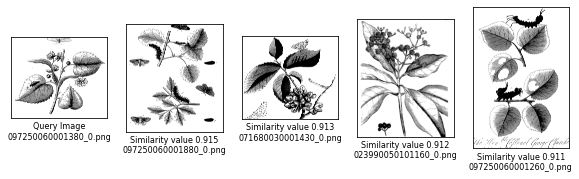

<Figure size 432x288 with 0 Axes>

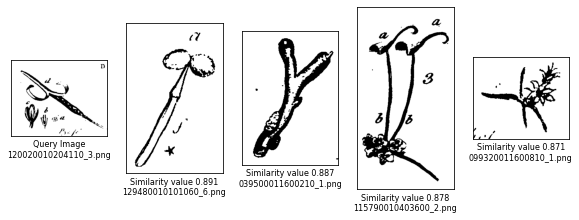

<Figure size 432x288 with 0 Axes>

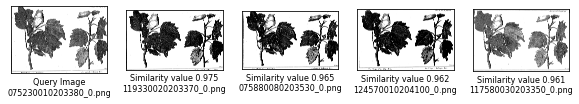

<Figure size 432x288 with 0 Axes>

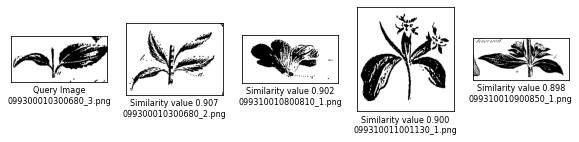

<Figure size 432x288 with 0 Axes>

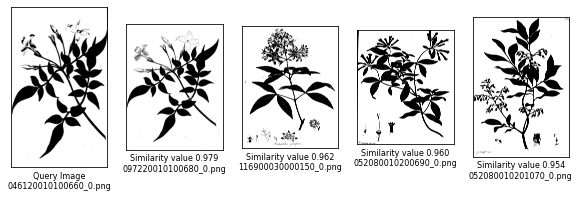

<Figure size 432x288 with 0 Axes>

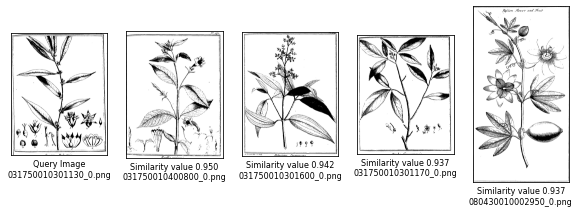

<Figure size 432x288 with 0 Axes>

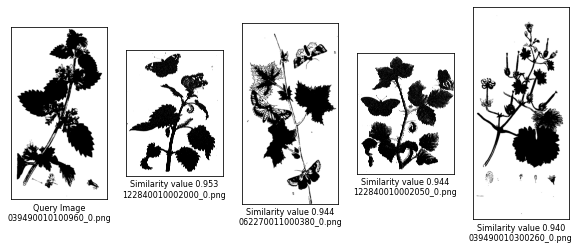

<Figure size 432x288 with 0 Axes>

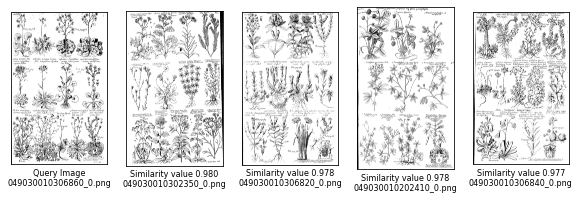

<Figure size 432x288 with 0 Axes>

In [43]:
# Load image feature vector from repository or create if necessary. Select some images to be plotted and k-most similar images
# in same graph

modelType = "resnet50"
img2vec = Image2Vector(modelType, tc)
feature_vectors_r50 = loadVectors(modelType, DB_DIR, DATA_DIR, tc)
similarityMatrix_r50 = getSimilarityMatrix(feature_vectors_r50)
simNames_r50, simValues_r50 = createSimilarityDB(similarityMatrix_r50, modelType, DB_DIR, 5)

numCol = 5
numRow = 1
num_files = 10
all_files = os.listdir(DATA_DIR)
# Shuffle the list of files randomly
random.shuffle(all_files)
selected_files = all_files[:num_files]

for image in selected_files:
    plotSimilarImages(image, DATA_DIR, numCol, numRow,simNames_r50, simValues_r50, modelType)

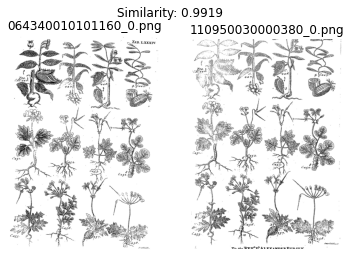

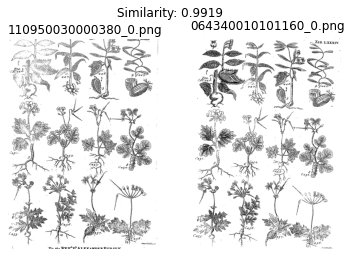

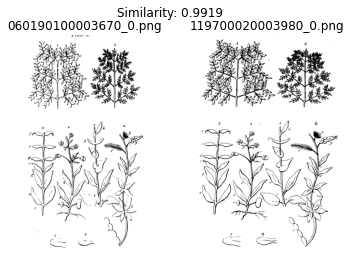

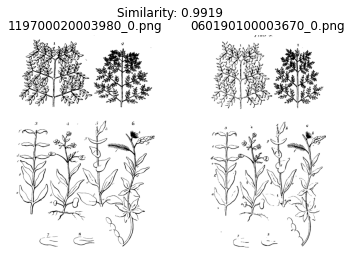

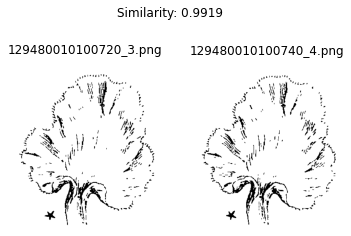

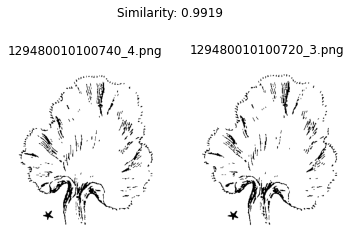

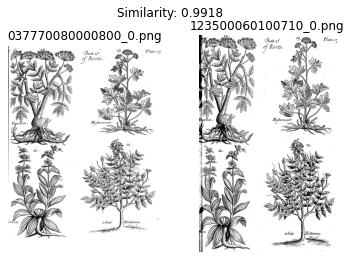

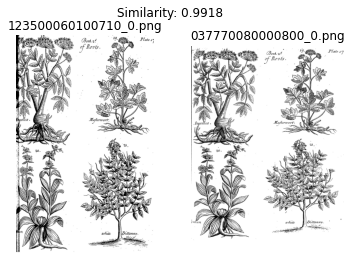

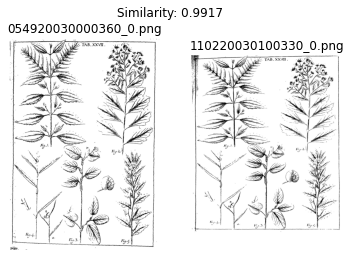

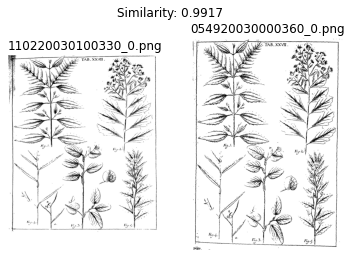

In [44]:
# For each image pick the most similar image and plot a selection of these in pairs. 
# This enables visual inspection of similarity 

r50_data = []
for x,y,z in zip(simNames_r50.index, list(simNames_r50[1]), list(simValues_r50[1])):
    r50_data.append([x,y,z])
r50_data.sort(key=sortKey,reverse=True)

for x in r50_data[100:110]:
    plot_images(DATA_DIR, x[0], DATA_DIR, x[1], "Similarity: {:.4f}".format(x[2]))

## Data visualization

### Resnet18

C:\Users\arive\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading feature vectors from C:/Users/arive/Datasets/DHH23\feature_vectors_resnet18.pkl


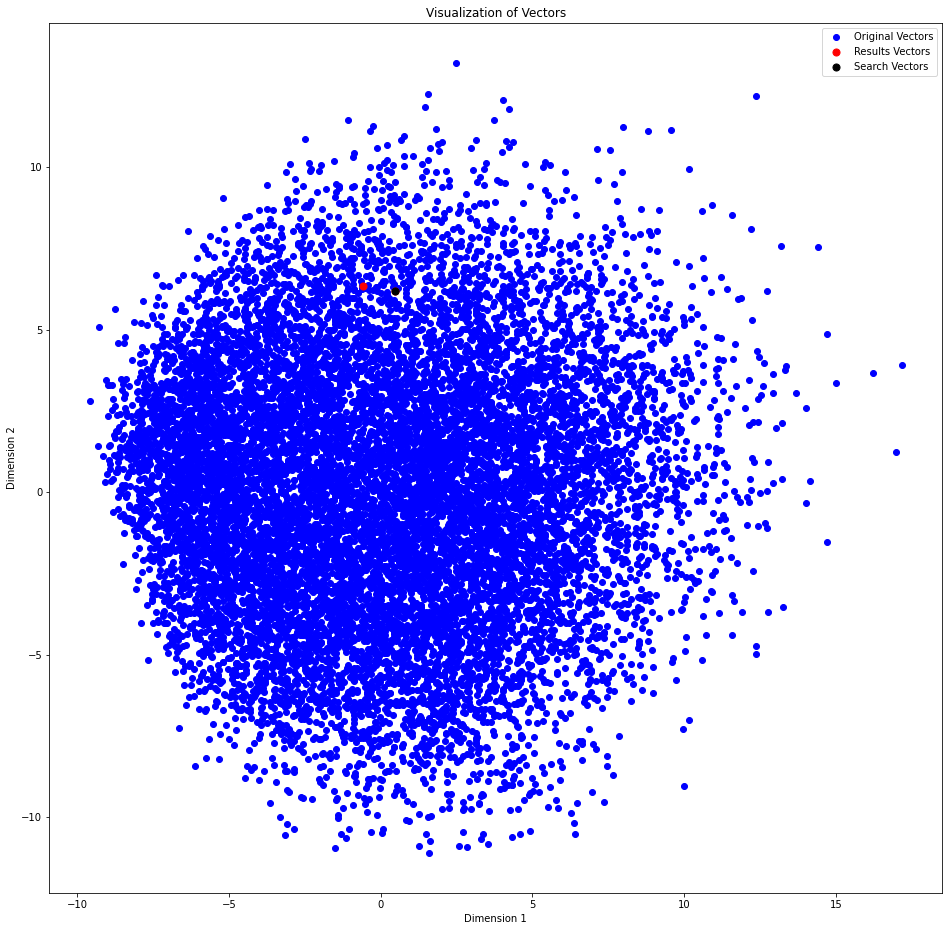

<Figure size 432x288 with 0 Axes>

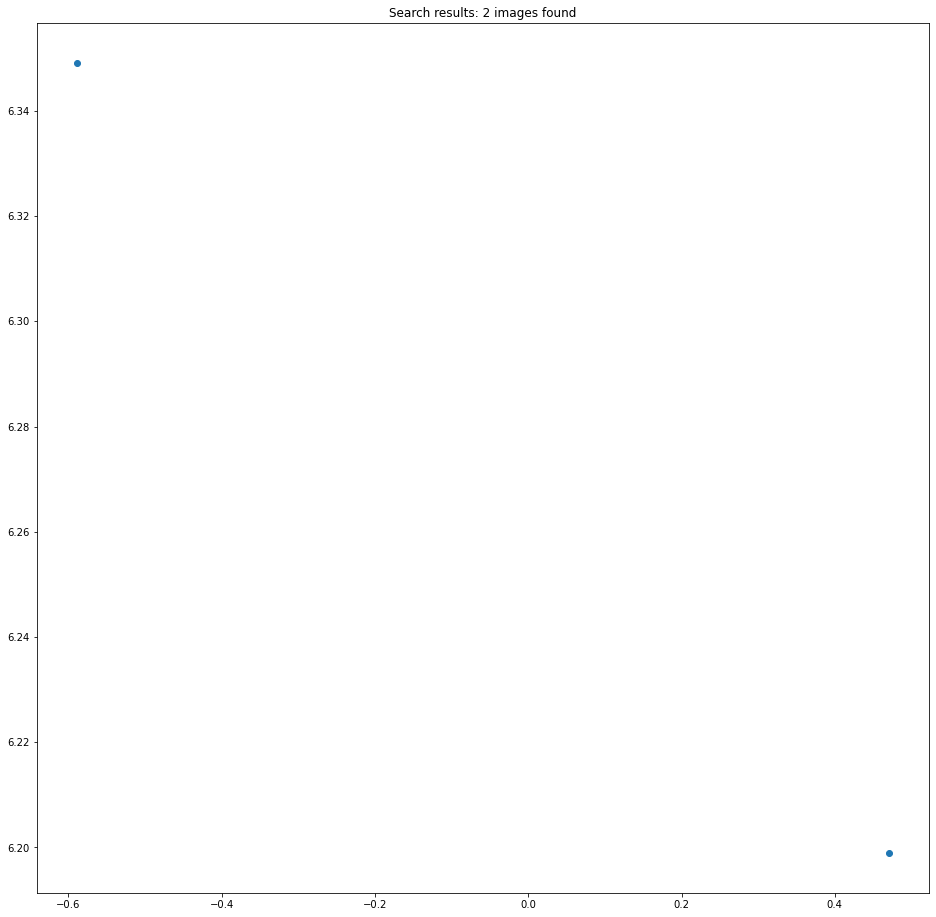

<Figure size 432x288 with 0 Axes>

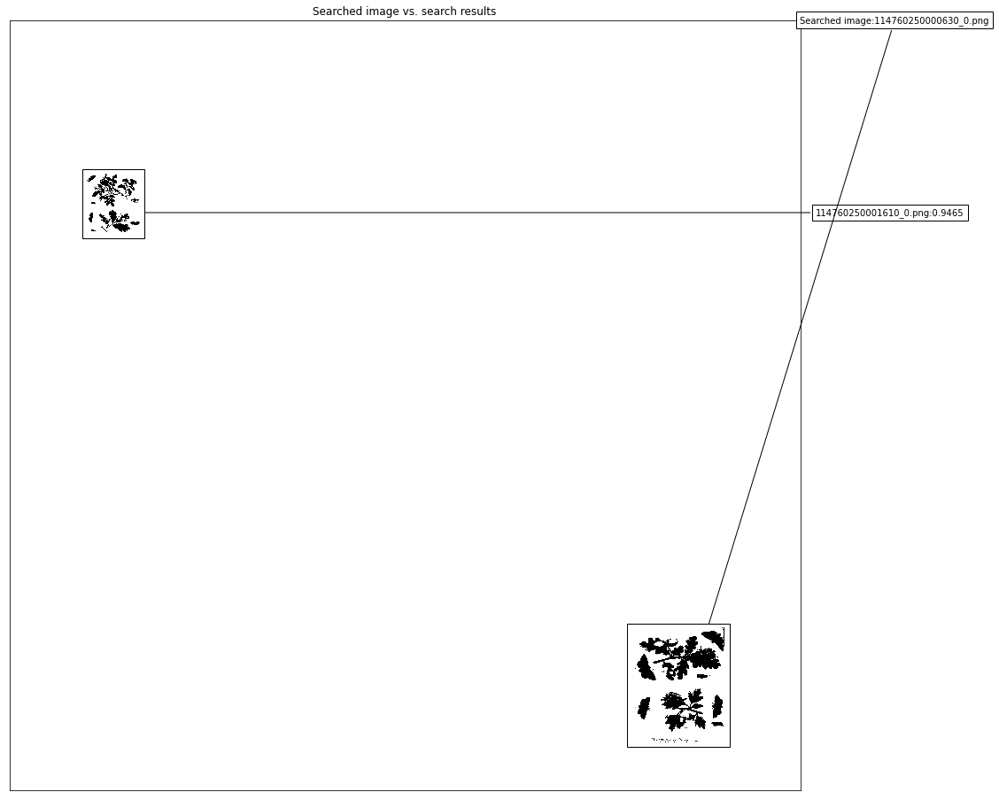

In [45]:
# Search similar images for one illustration and visualize results (all images in 2-dimensional space and how searched
# image and results are located, searched image and results presented as thumpnails showing how close these are related)  

image_path = "C:/Users/arive/Datasets/DHH23/search/114760250000630_0.png"
data_dir = DATA_DIR
feature_vectors_path = "C:/Users/arive/DHH23/feature_vectors_resnet18.pkl"
modelType = "resnet18"
threshold = 0.94
img2vec = Image2Vector(modelType, tc)
feature_vectors_r80 = loadVectors(modelType, DB_DIR, DATA_DIR, tc)
searchImage(data_dir, feature_vectors_r18, img2vec,threshold, image_path, modelType)


C:\Users\arive\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading feature vectors from C:/Users/arive/Datasets/DHH23\feature_vectors_resnet18.pkl


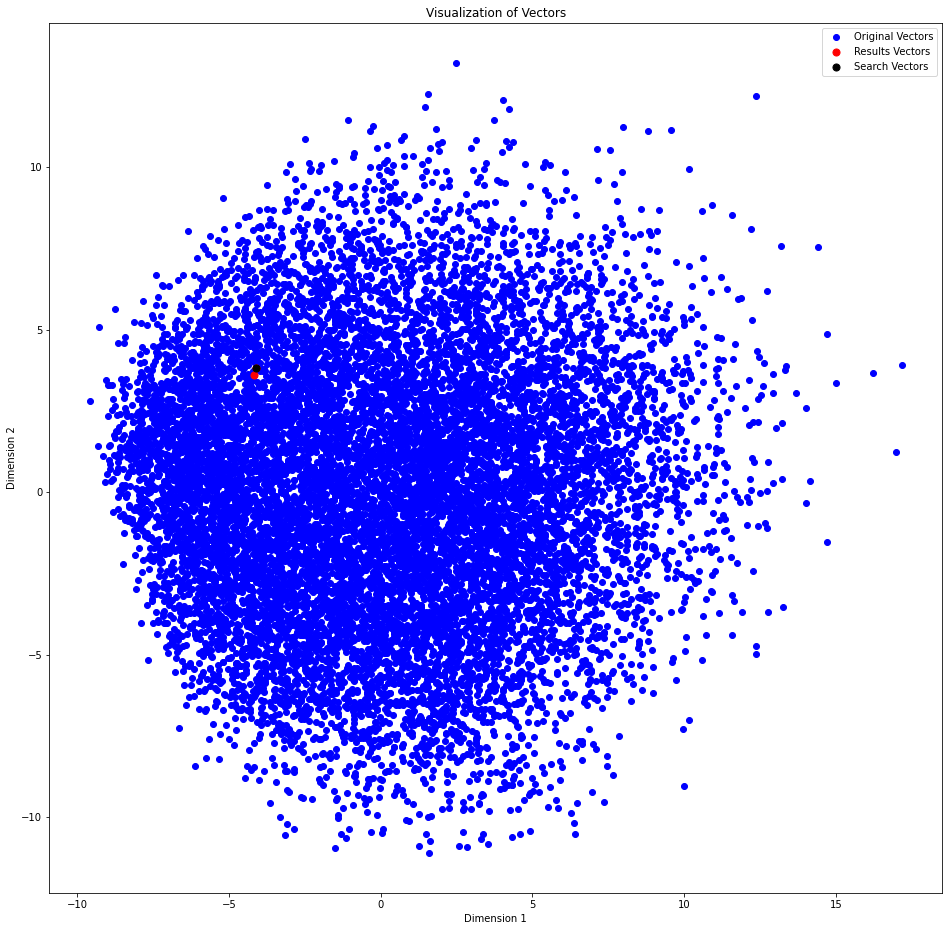

<Figure size 432x288 with 0 Axes>

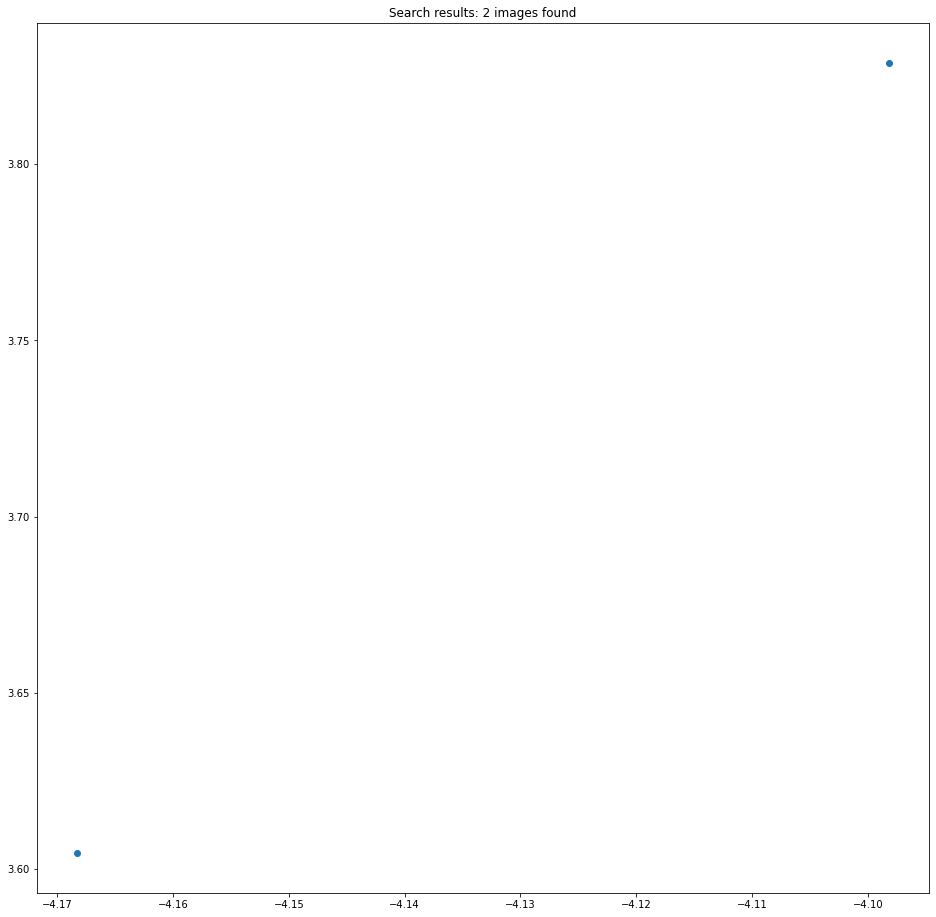

<Figure size 432x288 with 0 Axes>

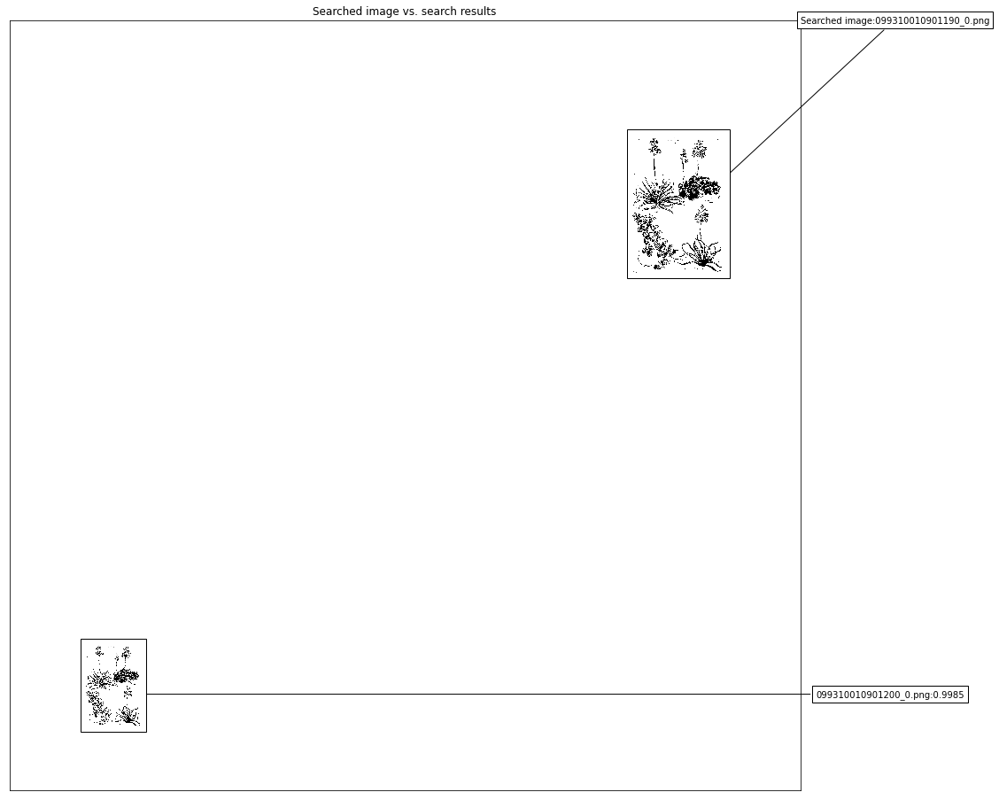

In [46]:
# Same as above, but now the searched image is image where the similarity score is highest

image_path = os.path.join(DATA_DIR, r18_data[0][0])
data_dir = DATA_DIR
feature_vectors_path = "C:/Users/arive/DHH23/feature_vectors_resnet50.pkl"
modelType = "resnet18"
threshold = THRESHOLD
img2vec = Image2Vector(modelType, tc)
feature_vectors_r18 = loadVectors(modelType, DB_DIR, DATA_DIR, tc)
searchImage(data_dir, feature_vectors_r18, img2vec,threshold, image_path, modelType)

### Resnet50

C:\Users\arive\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading feature vectors from C:/Users/arive/Datasets/DHH23\feature_vectors_resnet50.pkl


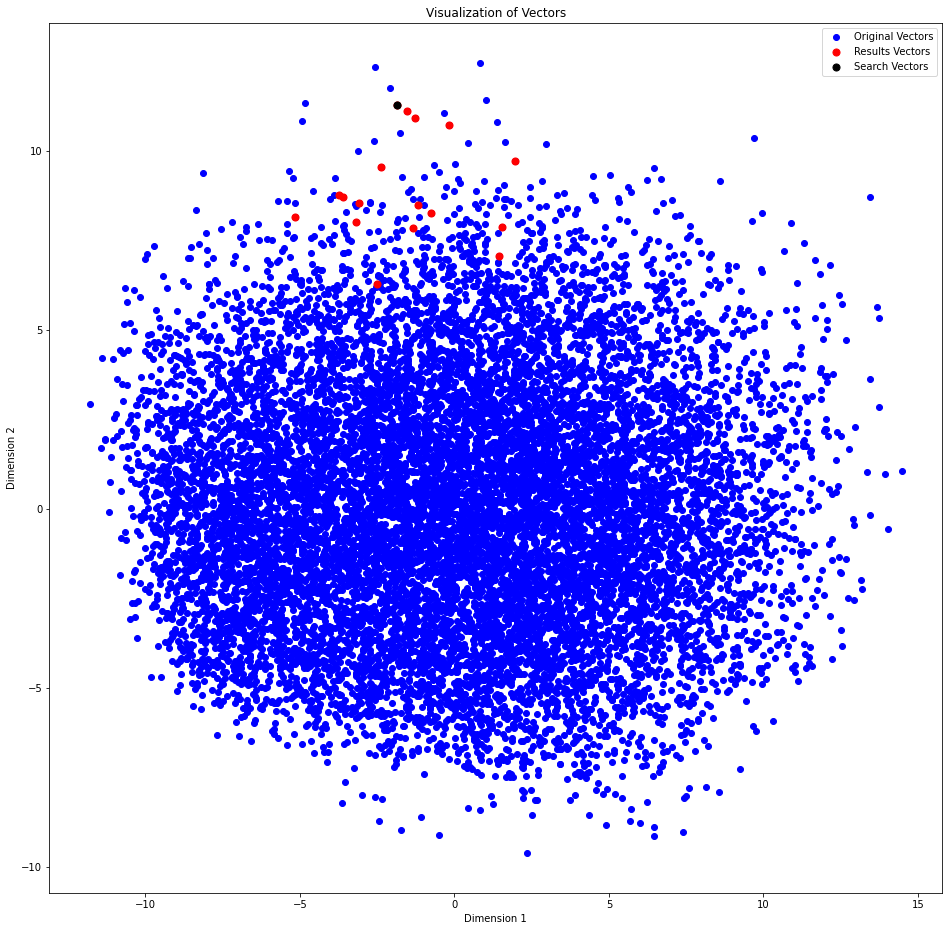

<Figure size 432x288 with 0 Axes>

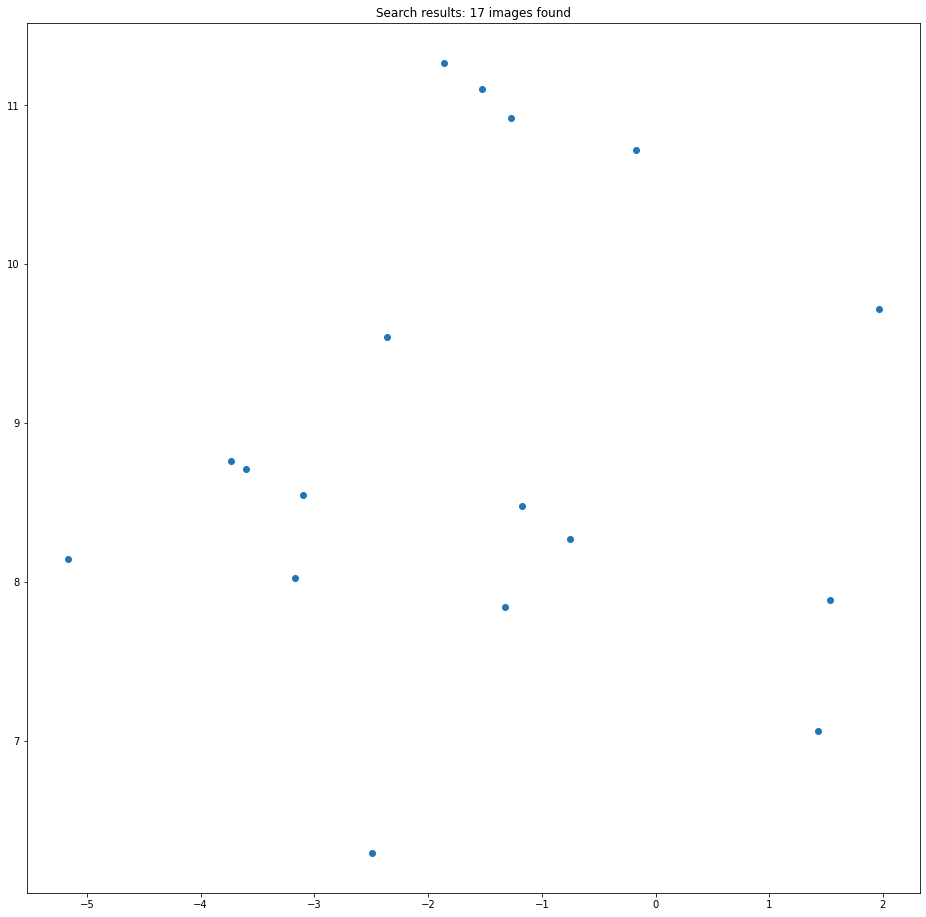

<Figure size 432x288 with 0 Axes>

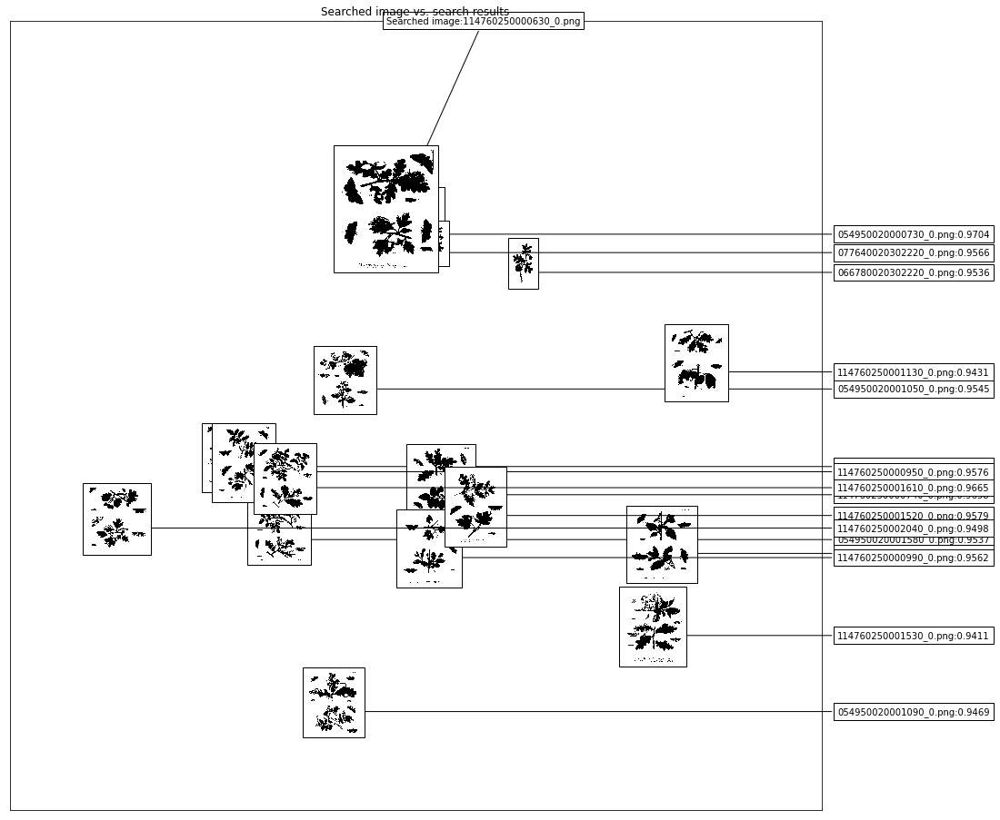

In [47]:
# Search similar images for one illustration and visualize results (all images in 2-dimensional space and how searched
# image and results are located, searched image and results presented as thumpnails showing how close these are related) 

image_path = "C:/Users/arive/Datasets/DHH23/search/114760250000630_0.png"
data_dir = DATA_DIR
feature_vectors_path = "C:/Users/arive/DHH23/feature_vectors_resnet50.pkl"
modelType = "resnet50"
threshold = 0.94
img2vec = Image2Vector(modelType, tc)
feature_vectors_r50 = loadVectors(modelType, DB_DIR, DATA_DIR, tc)
searchImage(data_dir, feature_vectors_r50, img2vec,threshold, image_path, modelType)


C:\Users\arive\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading feature vectors from C:/Users/arive/Datasets/DHH23\feature_vectors_resnet50.pkl


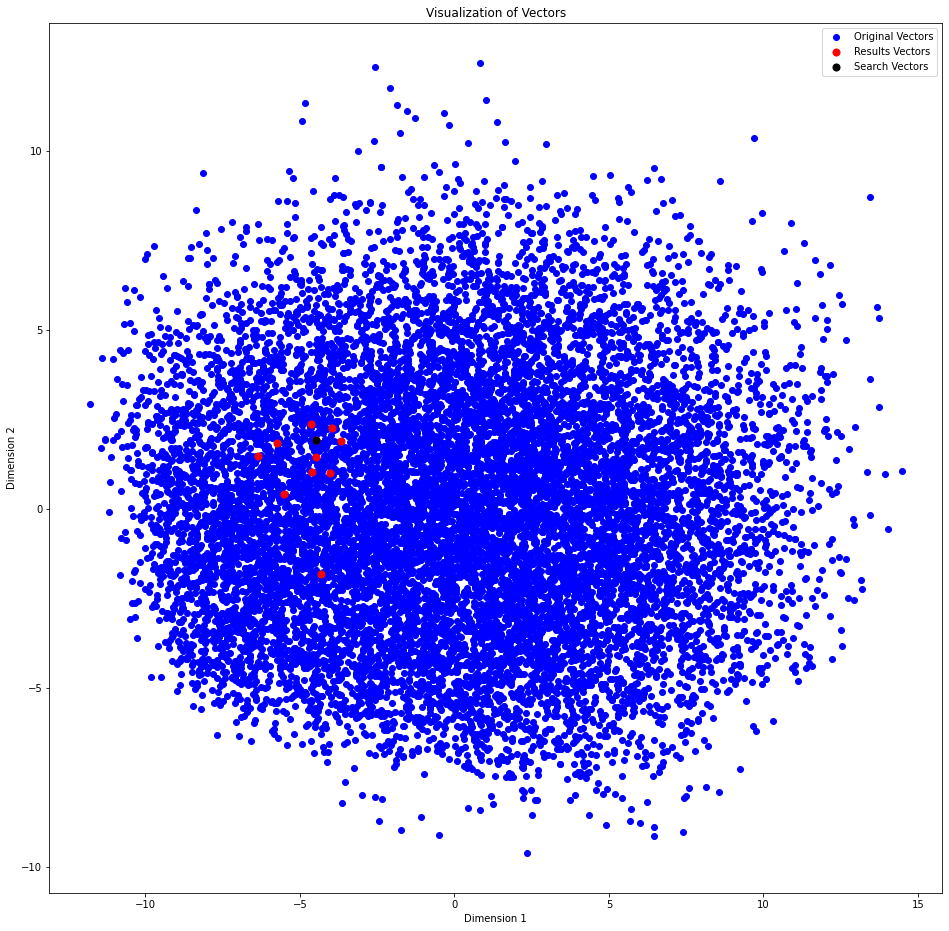

<Figure size 432x288 with 0 Axes>

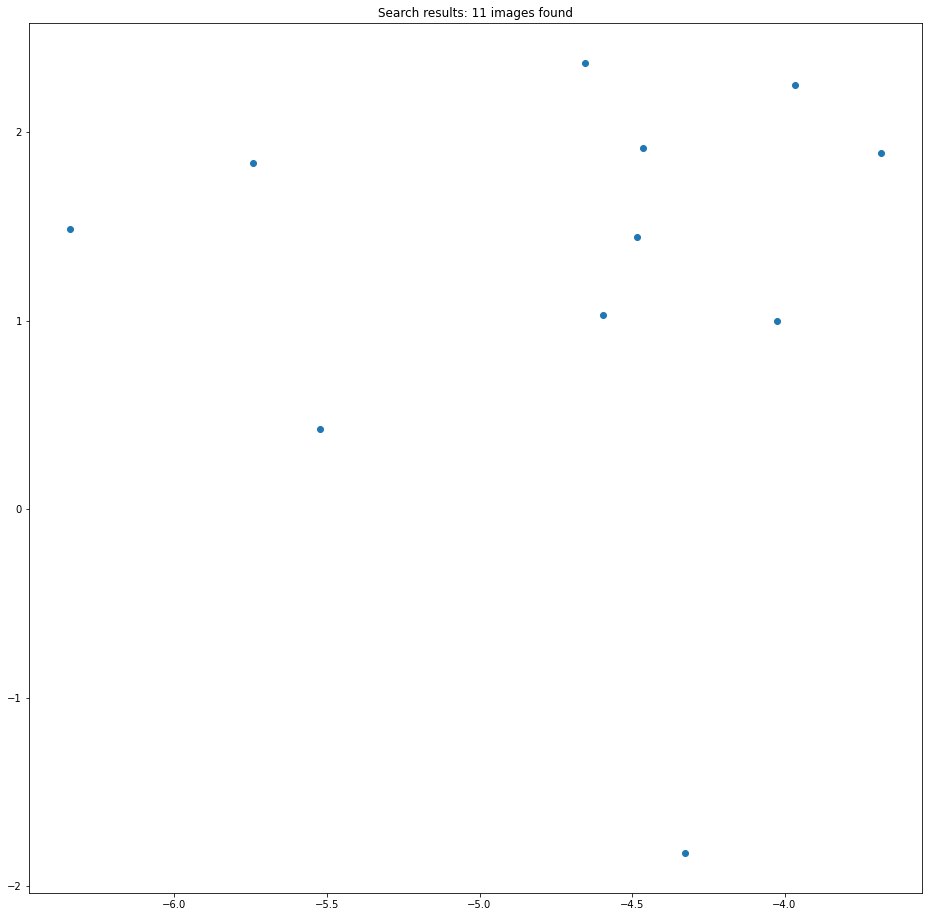

<Figure size 432x288 with 0 Axes>

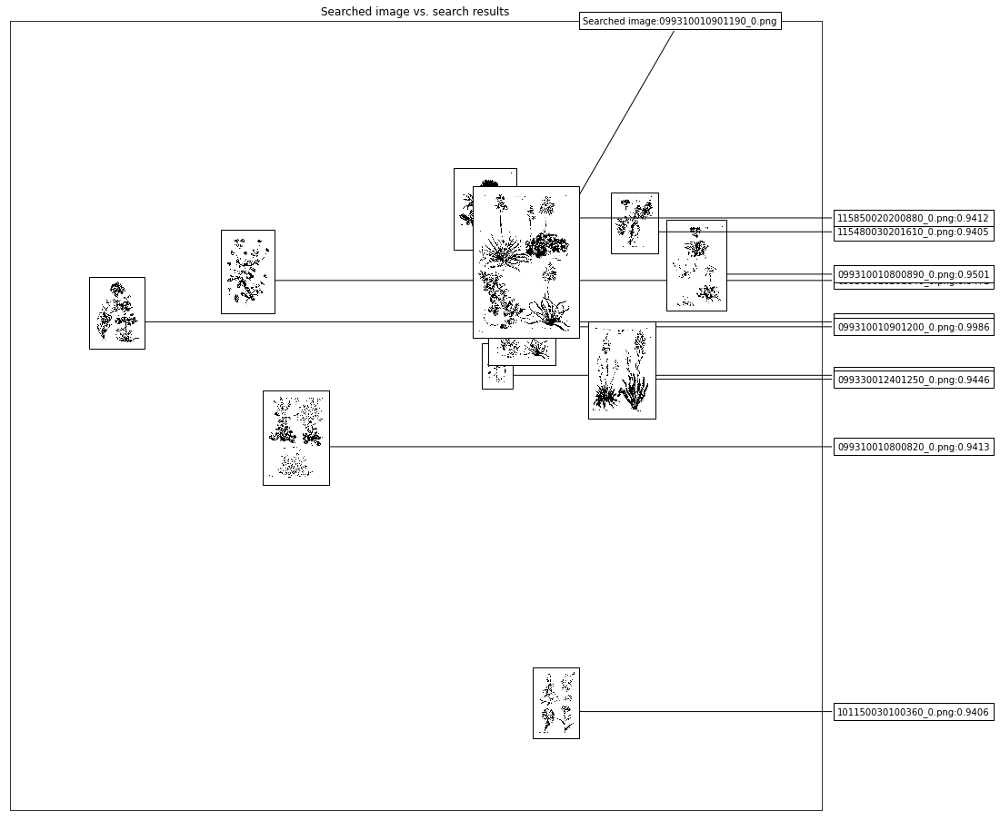

In [48]:
# Same as above, but now the searched image is image where the similarity score is highest

image_path = os.path.join(DATA_DIR, r50_data[0][0])
data_dir = "C:/Users/arive/Datasets/DHH23/botanical"
feature_vectors_path = "C:/Users/arive/DHH23/feature_vectors_resnet50.pkl"
modelType = "resnet50"
threshold = 0.94
img2vec = Image2Vector(modelType, tc)
feature_vectors_r50 = loadVectors(modelType, DB_DIR, DATA_DIR, tc)
searchImage(data_dir, feature_vectors_r50, img2vec,threshold, image_path, modelType)

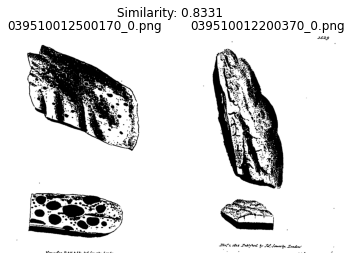

In [49]:
# Some ad-hoc visualizations, here an example of image where the closest image has lowish similarity score

x = r18_data[13100]
plot_images(DATA_DIR, x[0], DATA_DIR, x[1], "Similarity: {:.4f}".format(x[2]))

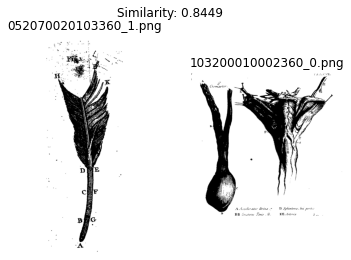

In [50]:
# another example,
x = r50_data[13100]
plot_images(DATA_DIR, x[0], DATA_DIR, x[1], "Similarity: {:.4f}".format(x[2]))

C:\Users\arive\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading feature vectors from C:/Users/arive/Datasets/DHH23\feature_vectors_resnet18.pkl


100%|███████████████████████████████████████████████████████████████████████████| 13151/13151 [00:24<00:00, 544.51it/s]


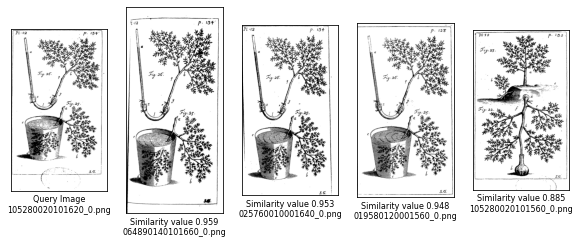

<Figure size 432x288 with 0 Axes>

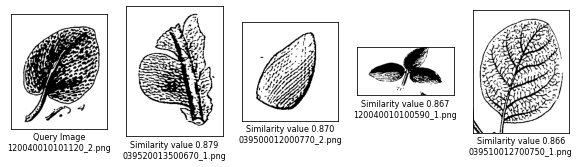

<Figure size 432x288 with 0 Axes>

In [51]:
# Comparison of similarities between two different models, first with resnet18

modelType = "resnet18"
img2vec = Image2Vector(modelType, tc)
feature_vectors_r18 = loadVectors(modelType, DB_DIR, DATA_DIR, tc)
similarityMatrix_r18 = getSimilarityMatrix(feature_vectors_r18)
simNames_r18, simValues_r18 = createSimilarityDB(similarityMatrix_r18, modelType, DB_DIR, 5)

numCol = 5
numRow = 1
image = "105280020101620_0.png"
plotSimilarImages(image, DATA_DIR, numCol, numRow,simNames_r18, simValues_r18, modelType)
image = "120040010101120_2.png"
plotSimilarImages(image, DATA_DIR, numCol, numRow,simNames_r18, simValues_r18, modelType)


C:\Users\arive\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading feature vectors from C:/Users/arive/Datasets/DHH23\feature_vectors_resnet50.pkl


100%|███████████████████████████████████████████████████████████████████████████| 13151/13151 [00:23<00:00, 564.64it/s]


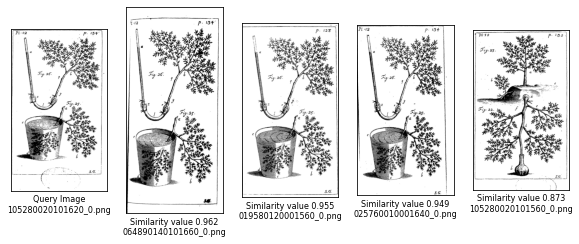

<Figure size 432x288 with 0 Axes>

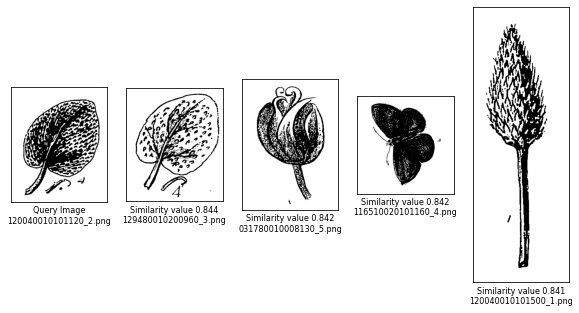

<Figure size 432x288 with 0 Axes>

In [52]:
# Comparison of similarities between two different models, now with resnet50

modelType = "resnet50"
img2vec = Image2Vector(modelType, tc)
feature_vectors_r50 = loadVectors(modelType, DB_DIR, DATA_DIR, tc)
similarityMatrix_r50 = getSimilarityMatrix(feature_vectors_r50)
simNames_r50, simValues_r50 = createSimilarityDB(similarityMatrix_r50, modelType, DB_DIR, 5)

numCol = 5
numRow = 1
image = "105280020101620_0.png"
plotSimilarImages(image, DATA_DIR, numCol, numRow,simNames_r50, simValues_r50, modelType)
image = "120040010101120_2.png"
plotSimilarImages(image, DATA_DIR, numCol, numRow,simNames_r50, simValues_r50, modelType)


## Some random data exploration

In [53]:
modelType = "resnet18"
img2vec = Image2Vector(modelType, tc)
feature_vectors_r18 = loadVectors(modelType, DB_DIR, DATA_DIR, tc)
similarityMatrix_r18 = getSimilarityMatrix(feature_vectors_r18)
simNames_r18, simValues_r18 = createSimilarityDB(similarityMatrix_r18, modelType, DB_DIR, 5)
modelType = "resnet50"
img2vec = Image2Vector(modelType, tc)
feature_vectors_r50 = loadVectors(modelType, DB_DIR, DATA_DIR, tc)
similarityMatrix_r50 = getSimilarityMatrix(feature_vectors_r50)
simNames_r50, simValues_r50 = createSimilarityDB(similarityMatrix_r50, modelType, DB_DIR, 5)

C:\Users\arive\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading feature vectors from C:/Users/arive/Datasets/DHH23\feature_vectors_resnet18.pkl


100%|███████████████████████████████████████████████████████████████████████████| 13151/13151 [00:23<00:00, 559.93it/s]
C:\Users\arive\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading feature vectors from C:/Users/arive/Datasets/DHH23\feature_vectors_resnet50.pkl


100%|███████████████████████████████████████████████████████████████████████████| 13151/13151 [00:23<00:00, 563.06it/s]


100%|███████████████████████████████████████████████████████████████████████████| 13151/13151 [00:58<00:00, 226.42it/s]


Number of common images among k-most similar images for resnet-18 and resnet-50 models
             #images     Count
                   0      5103
                   1      5008
                   2      2246
                   3       590
                   4       204
Same images in positions among 4-most similar images 
    Correct position     Count
                   1      3917
                   2      1179
                   3       599
                   4       364


13151it [00:00, 1882055.82it/s]


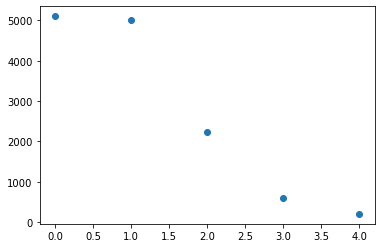

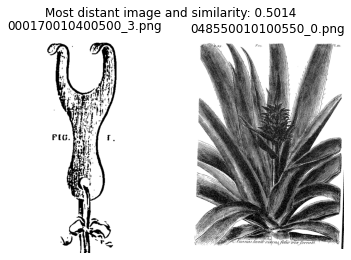

In [54]:
# Check how much the results of different models differ
# counts: how many common elements among 4-most similar between resnet-18 and reset-50 models
# pos: how many images are in same positions among 4-most similar images between resnet-18 and reset-50 models

counts = {0:0, 1:0, 2:0, 3:0, 4:0}
pos = {0:0, 1:0, 2:0, 3:0, 4:0}

cnt = 0
for s in tqdm(simNames_r18[1].values.tolist()):
    i18name_row = simNames_r18[simNames_r18[0]==s].values.tolist()[0]
    i50name_row = simNames_r50[simNames_r50[0]==s].values.tolist()[0]
    intersection_of_lists = Intersection(i18name_row[1:], i50name_row[1:])
    counts[len(intersection_of_lists)] += 1

    if i18name_row[1] == i50name_row[1]: pos[1] += 1
    if i18name_row[2] == i50name_row[2]: pos[2] += 1
    if i18name_row[3] == i50name_row[3]: pos[3] += 1
    if i18name_row[4] == i50name_row[4]: pos[4] += 1

    cnt += 1

print("Number of common images among k-most similar images for resnet-18 and resnet-50 models")
print("{:>20s}{:>10s}".format("#images", "Count"))
for c in counts.keys():
    print("{:20d}{:10d}".format(c, counts[c]))
    
print("Same images in positions among 4-most similar images ")

print("{:>20s}{:>10s}".format("Correct position", "Count"))
for p in pos.keys():
    if p != 0:
        print("{:20d}{:10d}".format(p, pos[p]))



plt.scatter([0,1,2,3,4],list(counts.values()))
sname = simNames_r18.iloc[0,0]
row = similarityMatrix_r50.iloc[4:5]
minSim = 1.0
sname = '000170010400500_3.png'
for name,sim in tqdm(zip(list(row.columns), row.values.tolist()[0])):
    if sim < minSim:
        minSim = sim
        minname = name
        
plot_images(DATA_DIR, sname, DATA_DIR, minname, "Most distant image and similarity: {:.4f}".format(minSim))

In [55]:
def plot_different_similarities(image):

    sims = similarityMatrix_r18[image].values.tolist()
    images = similarityMatrix_r18[image].index.tolist()

# Check how different similarities looks in reality as plotted
    between_05_and_06 = []
    between_06_and_07 = []
    between_07_and_08 = []
    between_08_and_09 = []
    between_09_and_10 = []
    
# Iterate through the list of images and similarity values
    for sim,name in zip(sims, images):
        if 0.5 < sim <= 0.6:
            between_05_and_06.append([name,sim])
        elif 0.6 < sim <= 0.7:
            between_06_and_07.append([name,sim])
        elif 0.7 < sim <= 0.8:
            between_07_and_08.append([name,sim])
        elif 0.8 < sim <= 0.9:
            between_08_and_09.append([name,sim])
        elif 0.9 < sim <= 1.0:
            between_09_and_10.append([name,sim])
    random_05_and_06 = random.sample(between_05_and_06, min(len(between_05_and_06),3))
    random_06_and_07 = random.sample(between_06_and_07, min(len(between_06_and_07),3))
    random_07_and_08 = random.sample(between_07_and_08, min(len(between_07_and_08),3))
    random_08_and_09 = random.sample(between_08_and_09, min(len(between_08_and_09),3))
    random_09_and_10 = random.sample(between_09_and_10, min(len(between_09_and_10),3))

    for item in random_05_and_06:
        plot_images(DATA_DIR, image, DATA_DIR, item[0], "Similarity: {:.4f}".format(item[1]))
    for item in random_06_and_07:
        plot_images(DATA_DIR, image, DATA_DIR, item[0], "Similarity: {:.4f}".format(item[1]))
    for item in random_07_and_08:
        plot_images(DATA_DIR, image, DATA_DIR, item[0], "Similarity: {:.4f}".format(item[1]))
    for item in random_08_and_09:
        plot_images(DATA_DIR, image, DATA_DIR, item[0], "Similarity: {:.4f}".format(item[1]))
    for item in random_09_and_10:
        plot_images(DATA_DIR, image, DATA_DIR, item[0], "Similarity: {:.4f}".format(item[1]))

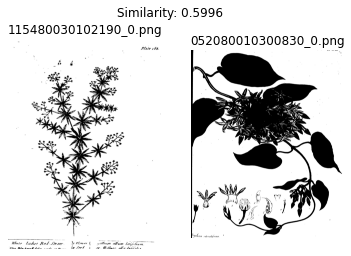

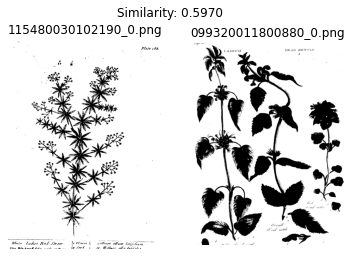

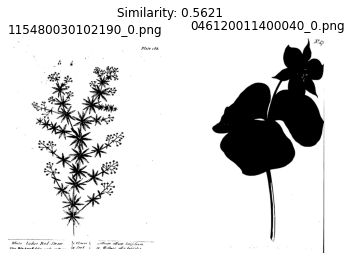

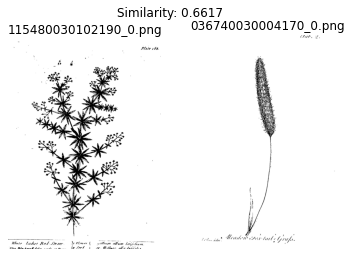

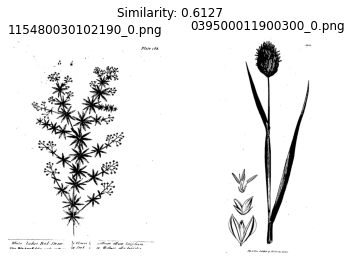

...

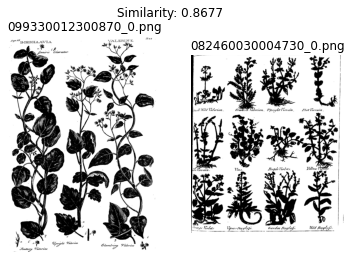

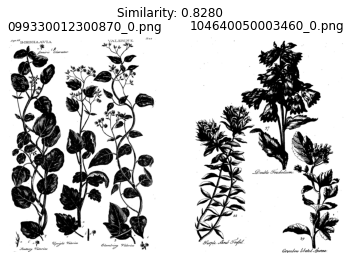

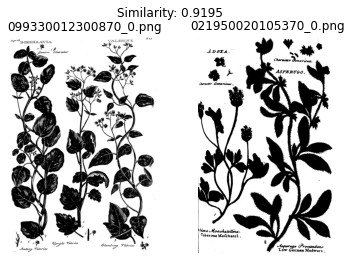

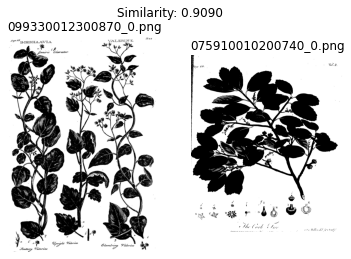

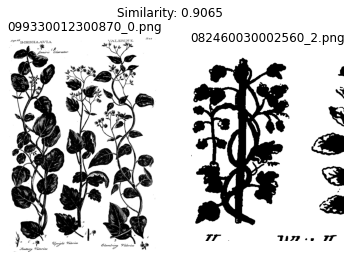

In [56]:
images = similarityMatrix_r18[image].index.tolist()
selected_images = random.sample(images, 10)
for img in selected_images:
    plot_different_similarities(img)
